<div style="text-align: center;">
  <img src="https://i.giphy.com/media/v1.Y2lkPTc5MGI3NjExb3YxYzVhbXJzajQwZnUyMGYwY2twZG02b2N2MGlhcGFqb3E5enljcSZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/9jwR2KCuAf8aIANOUr/giphy.gif" alt="discoscope">
</div>

<div style="text-align: center;">
  <img src="https://i.giphy.com/media/v1.Y2lkPTc5MGI3NjExMHRraWd5Ynh0ZXd2MDMzNHQyNjg1aDdtamYzOGdnNWJ5ZnA4dHpxZiZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/DlzkauL6oUw8jg8ny2/giphy.gif" width="700" alt="presentation">
</div>

# 1.&nbsp;Insaller les dépendances de la détection d'objet TensorFlow 

>Toutd'abord, nous allons installer l'API de dectection d'objets TensorFlow. Cela nécéssite de cloner le dépot [TensorFlow models repository](https://github.com/tensorflow/models) et d'exécuter quelques commandes d'installation. </p>
Pour des raisons de compatibilité de version python et de raspberry, nous avonsutiliséles version 3.9.2 de python et la version 2.8.0 de TensorFlow.

In [1]:
# on met à jour la version de pip 
!python.exe -m pip install --upgrade pip

In [46]:
# on va stocker le chemin du repertoire de travail dans la variable WORK_PATH
WORK_PATH=%pwd
#comme nous somme sur windows le chemin stocké est de forme : D:\folder\files
#pour que cela fonctionne en python le chemin doit être de la forme D:/folder/files 
# pour cela on utilise la fonction replace
WORK_PATH=WORK_PATH.replace("\\","/")
print(WORK_PATH)

D:/bibi/test_atelier/mifobio_discoscope


In [47]:
#on va cloner  "tensorflow model"  a partir du dépot GitHub dans un dossier nommer models
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
Updating files:  29% (1145/3926)
Updating files:  30% (1178/3926)
Updating files:  31% (1218/3926)
Updating files:  32% (1257/3926)
Updating files:  33% (1296/3926)
Updating files:  34% (1335/3926)
Updating files:  35% (1375/3926)
Updating files:  36% (1414/3926)
Updating files:  37% (1453/3926)
Updating files:  38% (1492/3926)
Updating files:  39% (1532/3926)
Updating files:  40% (1571/3926)
Updating files:  41% (1610/3926)
Updating files:  42% (1649/3926)
Updating files:  43% (1689/3926)
Updating files:  44% (1728/3926)
Updating files:  45% (1767/3926)
Updating files:  46% (1806/3926)
Updating files:  47% (1846/3926)
Updating files:  48% (1885/3926)
Updating files:  49% (1924/3926)
Updating files:  50% (1963/3926)
Updating files:  51% (2003/3926)
Updating files:  52% (2042/3926)
Updating files:  53% (2081/3926)
Updating files:  53% (2110/3926)
Updating files:  54% (2121/3926)
Updating files:  55% (2160/3926)
Updating files:  56% (2199/3926)
Updating files:  5

In [48]:
# on telecharge le zip du protobuf 3.18.0
# on installe les bibliothèques nécéssaires pour le téléchargement et le "dezipage" 
from urllib.request import urlretrieve
import zipfile

# on telecharge le zip du protobuf 3.18.0 a l'adresse suivante que l'on nomme protoc-3.18.0-win64.zip
urlretrieve('https://github.com/protocolbuffers/protobuf/releases/download/v3.18.0/protoc-3.18.0-win64.zip', 'protoc-3.18.0-win64.zip')

#on dezippe le fichier dans un dossier appelé proto
with zipfile.ZipFile(WORK_PATH+"/protoc-3.18.0-win64.zip",'r') as zip_ref:
    zip_ref.extractall(WORK_PATH+"/proto")


In [49]:

# on importe la biblothèque os permettant d'avoir accès à certainse fonctions de windows
import os

# on defini de nouvelles variable MODEL_PATH pour stocker le chemin du dossier d/dossier de travail/models/research
MODELS_PATH=os.path.join(WORK_PATH,'models','research')
#comme nous somme sur windows le chemin stocké est de forme : D:\folder\files
#pour que cela fonctionne en python le chemin doit être de la forme D:/folder/files 
# pour cela on utilise la fonction replace
MODELS_PATH=MODELS_PATH.replace('\\','/')

# on defini de nouvelles variable PROTOC_EXE qui stocker le chemin du dossier ou est situé le proto.exe
PROTOC_EXE=os.path.join(WORK_PATH,'proto','bin','protoc.exe')
PROTOC_EXE=PROTOC_EXE.replace('\\','/')

#on se positionne dans le dossier lecteur:/Dossier de travail/models/research
os.chdir(MODELS_PATH)



#on execute le fichier proto.exe sur tous les fichiers du  dossier lecteur:/Dossier de travail/models/research/object_detection/protos
#cette fonction transforme tous les fichiers .proto en fichier python .py
!{PROTOC_EXE} object_detection\protos\*.proto --python_out=.
print("Protobuff_compilé")

Protobuff_compilé


In [50]:
# Modifiez le fichier setup.py pour installer le tf-models-official du repository destiné à TF v2.8.0.

import re

# Remplacez le chemin ci-dessous par le chemin approprié sur votre machine locale
input_path = os.path.join(MODELS_PATH,'object_detection/packages/tf2/setup.py')
output_path = os.path.join(MODELS_PATH,'setup.py')

# Lire le contenu du fichier
with open(input_path, 'r') as f:
    s = f.read()

# Modifier le contenu et écrire dans un nouveau fichier
s = re.sub('tf-models-official>=2.5.1', 'tf-models-official==2.8.0', s)

with open(output_path, 'w') as f:
    f.write(s)

print("Le fichier a été mis à jour et enregistré.")

Le fichier a été mis à jour et enregistré.


In [7]:
# Installez l'API de détection d'objets (REMARQUE : l'exécution de ce bloc prend environ 10 minutes)
# Il faut procéder à une correction temporaire avec PyYAML

!pip install pyyaml==5.3
!pip install {MODELS_PATH}
# Il est nécessaire de revenir à la version TF v2.8.0 du à un bug de compatibilité avec TF v2.10 (au 10/03/22).
!pip install tensorflow==2.8.0

# Installer CUDA version 11.0 (compatible avec TF v2.8.0)
!pip install tensorflow_io==0.23.1

Processing d:\bibi\test_atelier\mifobio_discoscope\models\research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1708902 sha256=62d79e96c8b4d0f211e48cd5a9b5927e760546b05f59b4aea41f7d9eed01a8af
  Stored in directory: C:\Users\bronsin\AppData\Local\Temp\pip-ephem-wheel-cache-fh0t5b72\wheels\f1\06\e5\da177edb4aa85c24e7e7c9d756f898511a7e845152c92d5547
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


  DEPRECATION: Building 'object-detection' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'object-detection'. Discussion can be found at https://github.com/pypa/pip/issues/6334


>Vous pouvez obtenir des avertissements ou des erreurs liés aux dépendances des paquets dans le bloc de code précédent, mais vous pouvez les ignorer pour l'instant.
>
>Testons notre installation en exécutant `model_builder_tf2_test.py` pour nous assurer que tout fonctionne comme prévu. Exécutez le bloc de code suivant et vérifiez qu'il se termine sans erreur. Si vous obtenez des erreurs, essayez de les rechercher sur Google

In [8]:
# nous allons installer quelques bibliothèques nécéssaires pour le fonctionnement 
!pip install protobuf==3.20.3
!pip install numpy==1.23.1
!pip install absl-py==1.4
!pip install tensorflow-metadata==1.16.0

In [51]:
# Exécutons le fichier de test Model Builder, juste pour vérifier que tout fonctionne correctement.

TEST_PATH=os.path.join(MODELS_PATH,'object_detection/builders')
TEST_PATH=TEST_PATH.replace("\\","/")
os.chdir(TEST_PATH)

!python model_builder_tf2_test.py
print("finish no errors")


finish no errors


Running tests under Python 3.9.2: D:\bibi\test_atelier\mifobio_discoscope\tflite\Scripts\python.exe
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2025-07-29 10:49:11.598838: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-29 10:49:15.246182: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 45510 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6
D:\bibi\test_atelier\mifobio_discoscope\tflite\lib\site-packages\object_detection\builders\model_builder.py:1112: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead
  logging.warn(('Building experimental DeepMAC 

# 2 Création des Labelmap et TFRecords 


>Nous devons créer une carte des étiquettes et convertir les images dans un format de fichier de données appelé TFRecords, qui est utilisé par TensorFlow pour l'entraînement. Nous utiliserons des scripts Python pour convertir automatiquement les données au format TFRecord. Avant de les exécuter, nous devons définir une carte des étiquettes pour nos classes.
>
>La section de code ci-dessous créera un fichier « labelmap.txt » contenant une liste de classes. Remplacez éventuellement le texte<font color='green'> droite, gauche, double </font> par vos propres classes, en ajoutant une nouvelle ligne pour chaque classe. Ensuite, cliquez sur « play » pour exécuter le code.

In [52]:
### Crée un fichier « labelmap.txt » contenant une liste des classes que le modèle de détection détectera.

os.chdir(WORK_PATH)
with open('labelmap.txt', 'a') as f:
    f.write("droite\n")
    f.write("gauche\n")
    f.write("double\n")

>Téléchargez et exécutez les scripts de conversion de données à partir [GitHub repository](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi) en cliquant sur « Play » dans les trois sections de code suivantes. Ils créeront des fichiers TFRecord pour les ensembles de données d'entraînement et de validation, ainsi qu'un fichier `labelmap.pbtxt`contenant la carte des étiquettes dans un format différent.

In [53]:
import subprocess

# téléchargement des datas et des scipts de conversion
from urllib.request import urlretrieve
import zipfile
urlretrieve('https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py', 'create_csv.py')
urlretrieve('https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py', 'create_tfrecord.py')


('create_tfrecord.py', <http.client.HTTPMessage at 0x29c10a735b0>)

In [54]:
# creation des fichiers CSV data et TFRecord

# on revient dans le dossier d'origine
os.chdir(WORK_PATH)

# on lance les scripts de creation csv
!python {WORK_PATH}/create_csv.py 
!python create_tfrecord.py --csv_input={WORK_PATH}/images/train_labels.csv --labelmap={WORK_PATH}/labelmap.txt --image_dir={WORK_PATH}/images/train --output_path={WORK_PATH}/train.tfrecord
!python create_tfrecord.py --csv_input={WORK_PATH}/images/validation_labels.csv --labelmap={WORK_PATH}/labelmap.txt --image_dir={WORK_PATH}/images/validation --output_path={WORK_PATH}/val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
Successfully created the TFRecords: D:/bibi/test_atelier/mifobio_discoscope/train.tfrecord
Successfully created the TFRecords: D:/bibi/test_atelier/mifobio_discoscope/val.tfrecord


>Nous allons stocker les emplacements des fichiers TFRecord et labelmap sous forme de variables afin de pouvoir les référencer plus tard

In [55]:
train_record_fname =(WORK_PATH+'/train.tfrecord')
val_record_fname =(WORK_PATH+'/val.tfrecord')
label_map_pbtxt_fname =(WORK_PATH+'/labelmap.pbtxt')
print(train_record_fname)
print(val_record_fname)
print(label_map_pbtxt_fname)

D:/bibi/test_atelier/mifobio_discoscope/train.tfrecord
D:/bibi/test_atelier/mifobio_discoscope/val.tfrecord
D:/bibi/test_atelier/mifobio_discoscope/labelmap.pbtxt


# 3.&nbsp;Configuration de l'entrainement 


>Nous allons maintenant configurer le modèle et l'entraînement. Pour cela nous allons spécifier quel modèle TensorFlow pré-entraîné nous voulons utiliser parmi ceux proposés dans le [TensorFlow 2 Object Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md). Chaque modèle est accompagné d'un fichier de configuration qui indique l'emplacement des fichiers, définit les paramètres d'entraînement (tels que le taux d'apprentissage et le nombre total d'étapes d'entraînement), et plus encore. Nous allons modifier le fichier de configuration pour notre tâche d'entraînement.
>
>La première section du code répertorie certains modèles disponibles dans le TF2 Model Zoo et définit certains noms de fichiers qui seront utilisés ultérieurement pour télécharger le modèle et le fichier de configuration. Cela facilite la gestion du modèle que vous utilisez et l'ajout ultérieur d'autres modèles à la liste.
>
>Définissez la variable « chosen_model » pour qu'elle corresponde au nom du modèle que vous souhaitez entraîner. Elle est actuellement configurée pour utiliser le modèle populaire « ssd-mobilenet-v2 ». Cliquez sur « play » dans le bloc suivant une fois que le modèle choisi a été défini.
>
>Vous ne savez pas quel modèle choisir ? Consultez [ce lien](https://ejtech.io/learn/tflite-object-detection-model-comparison) pour comparer la vitesse et la précision de chaque modèle.

In [56]:
# chnager la variable chosen_model pour déployer un autre model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

print(model_name)
print(pretrained_checkpoint)
print(base_pipeline_file)

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config


>Téléchargez le fichier du modèle pré-entraîné et le fichier de configuration dans la section suivante.

In [57]:
# On va Créer un dossier « mymodel » pour stocker les poids pré-entraînés et les fichiers de configuration
MYMODEL_PATH=os.path.join(WORK_PATH,"models")
MYMODEL_PATH=MYMODEL_PATH.replace("\\","/")
os.chdir(MYMODEL_PATH)
%mkdir mymodel
MYMODEL_PATH=os.path.join(MYMODEL_PATH,"mymodel").replace("\\","/")
print(MYMODEL_PATH)

os.chdir(MYMODEL_PATH)

# on télécharge le poids du modèle pré-entraîné et on le décompresse
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
urlretrieve('http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint, pretrained_checkpoint)
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()


# Télécharger le fichier de configuration du modèle
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
urlretrieve('https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file, base_pipeline_file)



D:/bibi/test_atelier/mifobio_discoscope/models/mymodel


('ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
 <http.client.HTTPMessage at 0x29c10a62af0>)


>Maintenant que nous avons téléchargé notre modèle et notre fichier de configuration, nous devons modifier le fichier de configuration avec certains paramètres d'entraînement. Les variables suivantes sont utilisées pour contrôler les étapes d'entraînement :
>
>* **num_steps**: nombre total d'étapes à utiliser pour l'entraînement du modèle. Vous pouvez utiliser plus d'étapes si vous remarquez que les mesures de perte continuent de diminuer à la fin de l'entraînement. Plus il y a d'étapes, plus l'entraînement sera long. L'entraînement peut également être arrêté prématurément si la perte se stabilise avant d'atteindre le nombre d'étapes spécifié.
>* **batch_size** : nombre d'images à utiliser par étape d'entraînement. Une taille de lot plus importante permet d'entraîner un modèle en moins d'étapes, mais la taille est limitée par la mémoire GPU disponible pour l'entraînement. Avec les GPU utilisés 16 est un bon nombre pour les modèles SSD et 4 est un bon nombre pour les modèles EfficientDet.
>
>D'autres informations relatives à l'entraînement, telles que l'emplacement du fichier du modèle pré-entraîné, le fichier de configuration et le nombre total de classes, sont également attribuées à cette étape. Pour en savoir plus sur la configuration de l'entraînement avec l'API TensorFlow Object Detection,vous pouvez lire cet [article](https://neptune.ai/blog/tensorflow-object-detection-api-best-practices-to-training-evaluation-deployment). .

In [58]:
# definissez le nombre d'étapes et la batch size
num_steps = 4900

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [59]:
# on défini l'emplacement des fichiers et du "chekpoint" 
pipeline_fname=MYMODEL_PATH+"/"+base_pipeline_file
pipeline_fname=pipeline_fname.replace('\\','/')
fine_tune_checkpoint = MYMODEL_PATH+"/" + model_name + '/checkpoint/ckpt-0'
fine_tune_checkpoint=fine_tune_checkpoint.replace("\\","/")

print(pipeline_fname)
print(fine_tune_checkpoint)


D:/bibi/test_atelier/mifobio_discoscope/models/mymodel/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
D:/bibi/test_atelier/mifobio_discoscope/models/mymodel/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0


In [60]:
#On défini le nombre de classes pour le fichier de configuration à partir des classes défini et on vérifie en l'écrivant dans la console.
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 3


>Ensuite, nous allons réécrire le fichier de configuration afin d'utiliser les paramètres d'entraînement que nous venons de spécifier. La section de code suivante remplacera automatiquement les paramètres nécessaires dans le fichier .config téléchargé et l'enregistrera sous le nom de fichier personnalisé « pipeline_file.config ».

In [61]:
#Le code ci dessous crée un fichier de configuration personnalisé avec nos données en écrivant l'ensemble de données
# le point de contrôle du modèle et les paramètres d'entraînement dans le fichier de pipeline_file.

import re
os.chdir(MYMODEL_PATH)

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)
print(MYMODEL_PATH)

writing custom configuration file
D:/bibi/test_atelier/mifobio_discoscope/models/mymodel


>Si vous êtes curieux, vous pouvez afficher le contenu du fichier de configuration ici dans le navigateur en exécutant la ligne de code ci-dessous.
mais cette cellule n'est pas obligatoire pour le bon fonctionnement

In [62]:
# cellule facultative pour info
with open('pipeline_file.config', 'r') as file:
    content = file.read()
    print(content)

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 3
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

>### 3.1 Suivi de l'apprentissage sous Tensor Board
>
>Nous allons créer un dossier « training »  « train » et  « eval » pour stocker les points de contrôle et les données de tensorbord.
Cela permettra de visualiser les courbes de Loss et de learning rate au fur et à mesure de l'apprentissage.

In [63]:
# Create "training" folder for checkpoints and "train" forlder inside training folder for tensorboard 
# Créer un dossier « training » pour les points de contrôle et les dossiers « train » et « eval » 
# à l'intérieur du dossier training pour tensorboard. 
import os
os.getcwd()
os.chdir(WORK_PATH)
%mkdir training
TRAINING=os.path.join(WORK_PATH,"training")
TRAINING=TRAINING.replace('\\','/')
os.chdir(TRAINING)
%mkdir train
%mkdir eval


EVAL=os.path.join(TRAINING,"eval")
EVAL=EVAL.replace("\\","/")
TRAIN=os.path.join(TRAINING,"train")
TRAIN=TRAIN.replace('\\','/')
os.chdir(MYMODEL_PATH)    

> Définissons par des variables les emplacements du fichier de configuration et du répertoire de sortie du modèle afin de pouvoir les appeler lors de l'entraînement

In [64]:
# Défini le chemin d'accès au fichier de configuration personnalisé et au répertoire dans lequel stocker les points de contrôle.
MODEL_PATH_EXE=os.path.join(MODELS_PATH,"object_detection","model_main_tf2.py")
pipeline_file = MYMODEL_PATH+'/pipeline_file.config'
model_dir = TRAINING+'/'

print(pipeline_file)
print(model_dir)

D:/bibi/test_atelier/mifobio_discoscope/models/mymodel/pipeline_file.config
D:/bibi/test_atelier/mifobio_discoscope/training/


>Nous sommes prêts à entraîner notre modèle de détection d'objets ! Avant de commencer l'entraînement, chargeons une session TensorBoard pour suivre la progression de l'entraînement. Une session TensorBoard apparaîtra dans le navigateur mais vide, car nous n'avons pas encore commencé l'entraînement. Une fois l'entraînement lancé, revenez ici et cliquez sur le bouton d'actualisation pour voir les courbes de "Loss" et "Learning rate" du modèle.

In [65]:
# Définir les répertoires de logs
train_log_dir = TRAIN 
val_log_dir = EVAL 
log_dir = {'train': train_log_dir, 'validation': val_log_dir} 
print(train_log_dir)
print(val_log_dir)

D:/bibi/test_atelier/mifobio_discoscope/training/train
D:/bibi/test_atelier/mifobio_discoscope/training/eval


In [66]:
#lance le tensor board et le dossier ou stocker les chekpoints et graph
log_dir=TRAINING
print(log_dir)

%load_ext tensorboard
%tensorboard --logdir $log_dir


D:/bibi/test_atelier/mifobio_discoscope/training
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


>### 3.2 Netoyage de la mémoire de TeansorBoard
>
> ⚠️ **Important :** Uniquement à lancer si vous avez déjà un graphique montrant des courbes de "loss" et "d'évaluation" <br>
> &ensp;  &ensp;  &ensp; il faut effacer les fichiers résident en mémoire pour cela suivez les instructions suivantes :
>
>
>#### 1 lancer les deux cellules suivantes pour tuer le processus memoire de Tensorboard
>
>#### 2 lancer la troisième cellule pour supprimer tous les fichiers dans les dossier "training" "eval" et "train" <br>  &ensp; &ensp; contenant tous les anciens chekpoints
>
>#### 3 effacer manuelement tous les fichiers temporaires dans C:\Users\Nom_utilisateur\AppData\Local\Temp <br>  &ensp; &ensp; ignorer ceux qui posent un problème
>
>#### 4 relancer la cellule en juste en haut de ce commentaire 

In [24]:
!pip install psutil

In [25]:
import psutil

# Chercher tous les processus et tuer celui de TensorBoard
for proc in psutil.process_iter(attrs=['pid', 'name']):
    if 'tensorboard' in proc.info['name'].lower():
        print(f"Tuer le processus TensorBoard (PID: {proc.info['pid']})")
        proc.terminate()

Tuer le processus TensorBoard (PID: 1056)


In [ ]:
# Effacement de tous les fichiers chekpoints dans le dossier "Training" 


import os, glob
 
dir = TRAINING
filelist = glob.glob(os.path.join(dir, "*"))
try:
    for f in filelist:
        os.remove(f)
except PermissionError as e:
    print ("fichiers du dossier training effacés")

# Effacement de tous les fichiers chekpoints dans le dossier "train" 
dir1 = train_log_dir
filelist = glob.glob(os.path.join(dir1, "*"))
try:
    for f in filelist:
        os.remove(f)
except PermissionError as e:
    print ("fichiers du dossier train effacés")

# Effacement de tous les fichiers chekpoints dans le dossier "eval" 
dir2 = val_log_dir
filelist = glob.glob(os.path.join(dir2, "*"))
try:
    for f in filelist:
        os.remove(f)
except PermissionError as e:
    print ("fichiers du dossier train effacés")

print("tous les fichiers sont effacés")
    


>### 3.3 Lancement de l'apprentissage
>
>L'entrainement sur notre jeux de données est effectuée à l'aide du script « model_main_tf2.py » de l'API TF Object Detection. Cet entrainement prendra entre 2 et 6 heures, selon le modèle, l'utilisation ou non des GPU, la taille du lot et le nombre d'étapes. Nous avons déjà défini tous les paramètres et arguments utilisés par « model_main_tf2.py » dans les sections précédentes. Cependant, le script « model_main_tf2.py » n'affiche que les courbes de train, nous avons donc modifié ce code afin qu'il montre dans TensorBoard les courbes de train et de validation. nous allons dans la première cellule remplacer le fichier model_main_tf2.py fournit par TF Object Detection par le notre situé dans le dossier a_copier
>
> *`Remarque : le programme met quelques minutes à afficher les messages d'entraînement, car il n'affiche les journaux qu'une fois tous les 100 pas.`*

In [67]:
import shutil

source = os.path.join(WORK_PATH,"a_copier","model_main_tf2.py")
source=source.replace('\\','/')

destination = os.path.join(MODELS_PATH,"object_detection")
destination=destination.replace('\\','/')

shutil.copy(source, destination)


'D:/bibi/test_atelier/mifobio_discoscope/models/research/object_detection\\model_main_tf2.py'

In [68]:
!pip install tensorflow_probability==0.24.0
!pip install tensorstore==0.1.66
!pip install absl-py==1.2
!pip install tensorflow-metadata==1.16.0

  Using cached absl_py-1.2.0-py3-none-any.whl.metadata (2.3 kB)
Using cached absl_py-1.2.0-py3-none-any.whl (123 kB)
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0


In [ ]:
!pip install ipython

In [69]:
# on defini une variable Model_Path_exe qui est le fichier nécéssaire pour lancer l'apprentissage 
MODEL_PATH_EXE=os.path.join(MODELS_PATH,"object_detection","model_main_tf2.py")
MODEL_PATH_EXE=MODEL_PATH_EXE.replace("\\","/")

In [70]:
# quelques print pour verifier les chemins utilisé pour la configuration
print("MODEL_PATH_EXE:", MODEL_PATH_EXE)
print("pipeline_file:", pipeline_file)
print("model_dir:", model_dir)

MODEL_PATH_EXE: D:/bibi/test_atelier/mifobio_discoscope/models/research/object_detection/model_main_tf2.py
pipeline_file: D:/bibi/test_atelier/mifobio_discoscope/models/mymodel/pipeline_file.config
model_dir: D:/bibi/test_atelier/mifobio_discoscope/training/


In [71]:
# Code de lancement de l'apprentissage avec affichage dynamique des étapes dans la console (adapté à un notebook Jupyter)

import subprocess         # Pour exécuter des commandes système (lancement du script d'entraînement)
import sys                # Pour obtenir le chemin de l'interpréteur Python courant
import threading          # Pour gérer l'exécution parallèle (lecture des flux en temps réel)
import queue              # Pour stocker les lignes de sortie à lire sans blocage
from IPython.display import display, clear_output  # Pour afficher dynamiquement les logs dans un notebook
from collections import deque  # File optimisée pour stocker un nombre limité de lignes (FIFO)

# Affichage du fichier de configuration utilisé (variable supposée définie en amont)
print("Lecture du fichier de configuration du pipeline : ", pipeline_file)

# Fonction utilitaire pour lire la sortie d’un flux (stdout ou stderr) dans un thread séparé
def enqueue_output(out, q):
    # Itère sur chaque ligne du flux et l’ajoute à la queue jusqu’à la fin du flux
    for line in iter(out.readline, ''):
        q.put(line)
    out.close()

# Fonction principale pour lancer le processus d'entraînement et afficher les logs en temps réel
def run_process():
    # Construction de la commande à exécuter (le script Python avec ses arguments)
    command = [
        sys.executable,  # Utilise l'interpréteur Python actuel
        '{}'.format(MODEL_PATH_EXE),  # Chemin vers le script Python d'entraînement
        '--pipeline_config_path={}'.format(pipeline_file),  # Chemin du fichier de config du pipeline
        '--model_dir={}'.format(model_dir),  # Répertoire de sortie du modèle
        '--alsologtostderr',  # Redirige les logs également vers stderr
        '--num_train_steps={}'.format(num_steps),  # Nombre d'étapes d'entraînement
        '--sample_1_of_n_eval_examples=1'  # Utilise tous les exemples pour l'éval (pas d’échantillonnage)
        # D'autres options peuvent être ajoutées ici, comme les répertoires de logs
    ]

    # Lancement du processus avec capture de stdout et stderr
    process = subprocess.Popen(
        command,
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True,             # Assure que la sortie est en texte (str) et non binaire
        bufsize=1,             # Lecture ligne par ligne
        universal_newlines=True
    )

    # Création d’une file thread-safe pour collecter les lignes de sortie
    q = queue.Queue()

    # Création de deux threads pour lire simultanément stdout et stderr
    t1 = threading.Thread(target=enqueue_output, args=(process.stdout, q))
    t2 = threading.Thread(target=enqueue_output, args=(process.stderr, q))
    t1.start()
    t2.start()

    # Stocke les dernières lignes de logs (jusqu'à 1000) pour les afficher dynamiquement
    log_lines = deque(maxlen=1000)
    seen_lines = set()  # Ensemble pour éviter d’afficher plusieurs fois la même ligne

    # Boucle principale de lecture et d’affichage
    while True:
        try:
            # Essaye de lire une ligne de la file sans attendre
            line = q.get_nowait()
        except queue.Empty:
            pass  # Si rien n’est lu, ne fait rien pour cette itération
        else:
            # Si la ligne n’a pas encore été affichée, on l’ajoute
            if line not in seen_lines:
                seen_lines.add(line)
                log_lines.append(line.strip())  # Nettoie les espaces inutiles
                clear_output(wait=True)        # Efface la sortie précédente (pour un affichage en direct)
                print("\n".join(log_lines))    # Affiche les dernières lignes

        # Si le processus est terminé, on sort de la boucle
        if process.poll() is not None:
            break

    # On attend que les deux threads aient fini leur lecture
    t1.join()
    t2.join()

# Appel de la fonction avec gestion des erreurs éventuelles
try:
    run_process()
except Exception as e:
    print("Erreur lors de l'exécution de la commande : ", e)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



# 4.&nbsp;Convertion du modèle en TensorFlowLite 

>Très bien !L'apprentissage est dini et notre modèle est prêt à être utilisé pour détecter des objets. Tout d'abord, nous devons exporter le graphe du modèle (un fichier contenant des informations sur l'architecture et les poids) dans un format compatible avec TensorFlow Lite. Pour ce faire, nous utiliserons le script  `export_tflite_graph_tf2.py` 

In [72]:
# on revient au dossier de travail 
os.chdir(WORK_PATH)
# on crée un dossier mon_model ou on sauvegardera le graph
!mkdir mon_model
CONVERT=os.path.join(WORK_PATH,'models','research','object_detection','export_tflite_graph_tf2.py')
CONVERT=CONVERT.replace("\\","/")
output_directory = os.path.join(WORK_PATH,'mon_model')
output_directory=output_directory.replace('\\','/')


# Chemin d'accès au répertoire de formation (le script de conversion choisit automatiquement le dernier checkpoint)
last_model_path = (TRAINING)



try :
    !python {CONVERT} \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}
except Exception as e:
    print("Erreur lors de la lecture du fichier : ", e)

print("finish")

finish


2025-07-29 11:59:12.483223: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-29 11:59:13.381209: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 45895 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6
I0729 11:59:18.182980 50156 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2025-07-29 11:59:22.716560: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 45895 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6
I0729 11:59:23.475936 50156 api.p

>
>Ensuite, nous allons prendre le graphique exporté et utiliser le module TFLiteConverter pour le convertir au format .tflite 

In [73]:
# Convertir le fichier graph exporte en fichier TFLite model
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model(output_directory+'/saved_model')
tflite_model = converter.convert()

with open(output_directory+'/detect.tflite', 'wb') as f:
  f.write(tflite_model)

# 5.&nbsp;Test du model TensorFlow Lite et calcul du mAP (mean average precision)

>
>Nous avons entraîné notre modèle et l'avons converti au format TFLite. Mais quelle est sa performance réelle en matière de détection d'objets dans les images ? C'est là que les images que nous avons mises de côté dans le dossier **test** entrent en jeu. Le modèle n'a jamais vu aucune image de test pendant l'entraînement, donc sa performance sur ces images devrait être représentative de sa performance sur de nouvelles images provenant d'une vérité terrain.
>
>### 5.1 Images de test d'inférence
>Le code suivant définit une fonction permettant d'effectuer une inférence sur les images du dossier test (L'inférence en deep learning vise à réaliser des prédictions efficaces à partir d'un modèle d'apprentissage entraîné). Il charge les images, charge le modèle et la carte d'étiquettes, exécute le modèle sur chaque image et affiche le résultat. Il enregistre également, de manière facultative, les résultats de la détection sous forme de fichiers texte afin que nous puissions les utiliser pour calculer le  mAP (Mean Average Precision ou  précision moyenne) du modèle.
>
>
>Ce code est basé sur le script [TFLite_detection_image.py](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py) du GitHub TensorFlow Lite Object Detection sur GitHub ; n'hésitez pas à l'utiliser comme point de départ pour vos propre applications.

In [74]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

#%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

>Le bloc suivant de code définit les chemins d'accès aux images et aux modèles de test, puis exécute la le modèle. Si vous souhaitez utiliser plus de 24 images, modifiez la variable `images_to_test`.


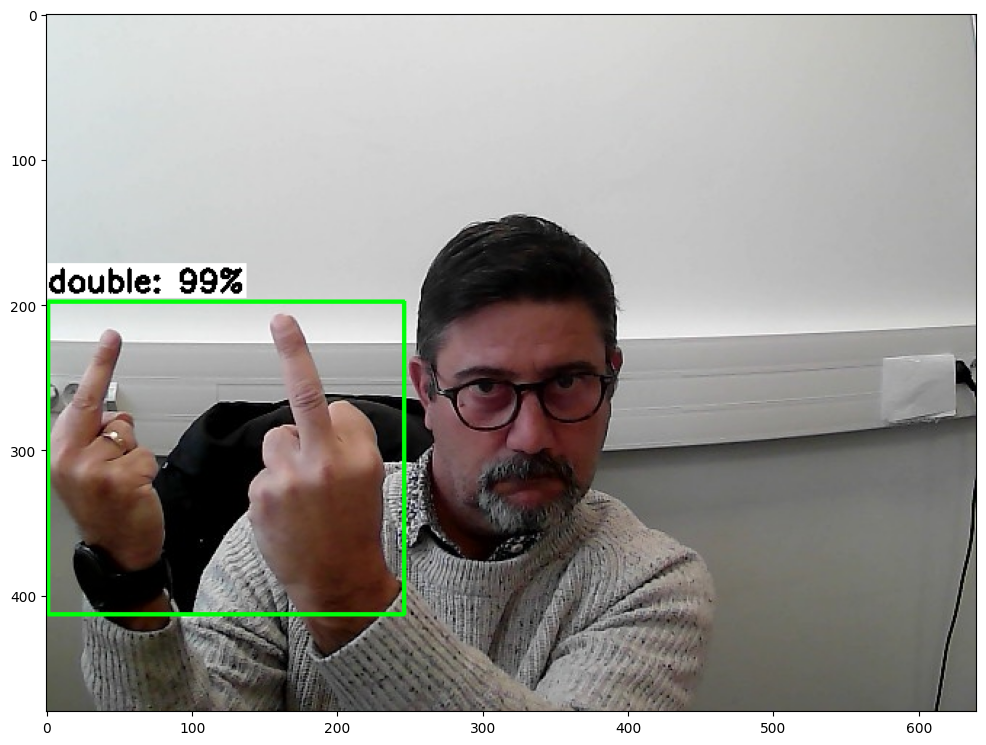

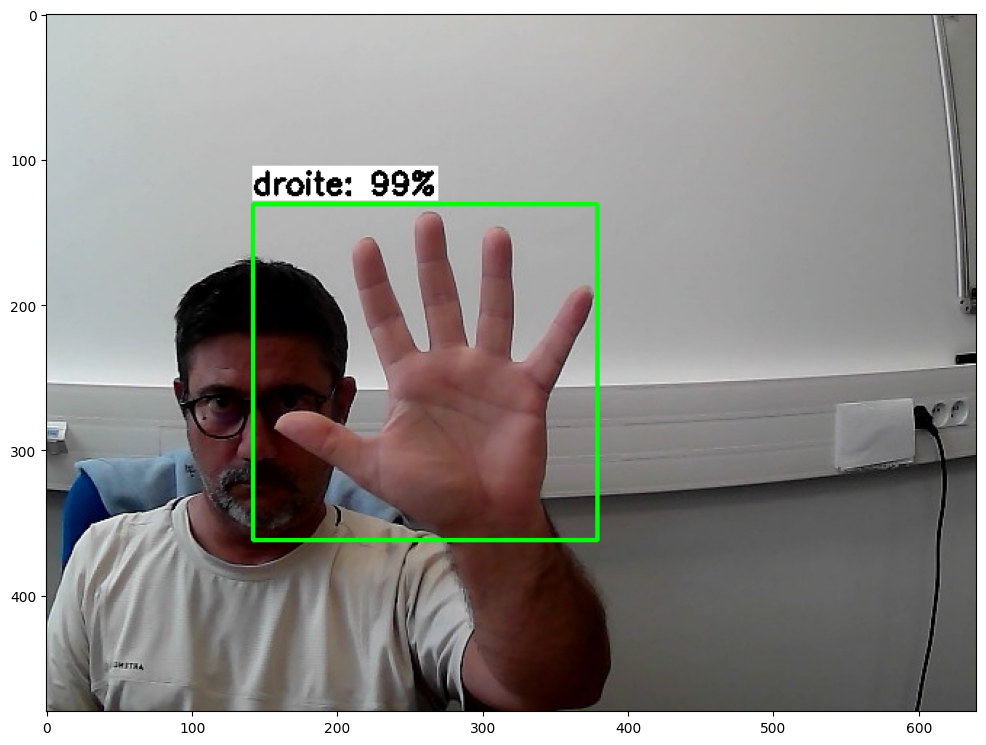

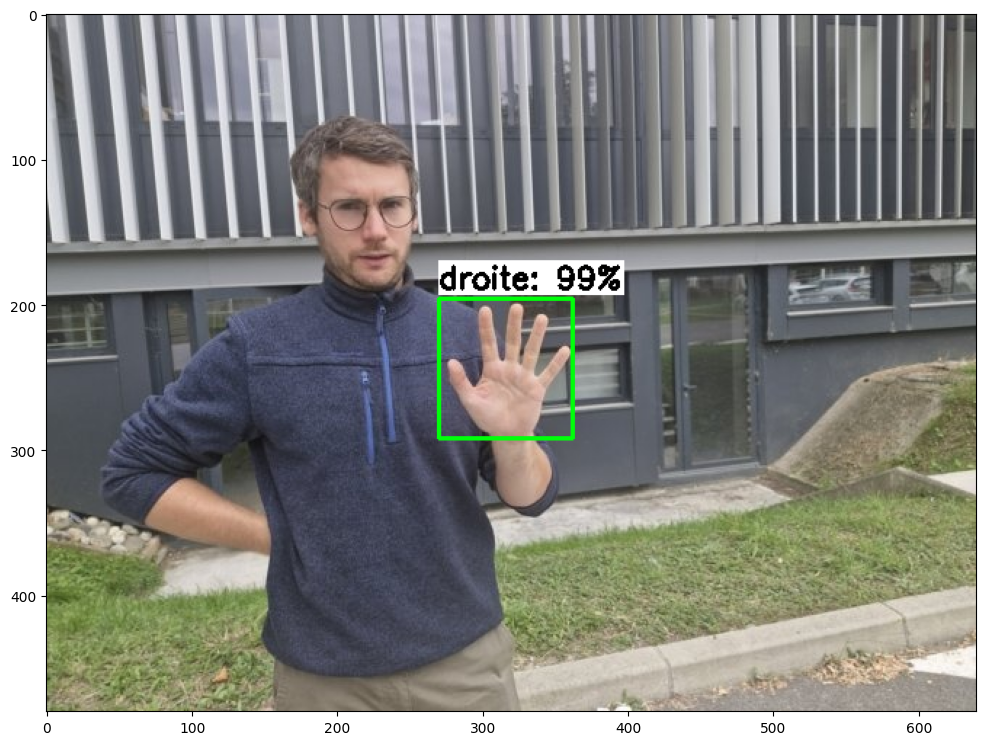

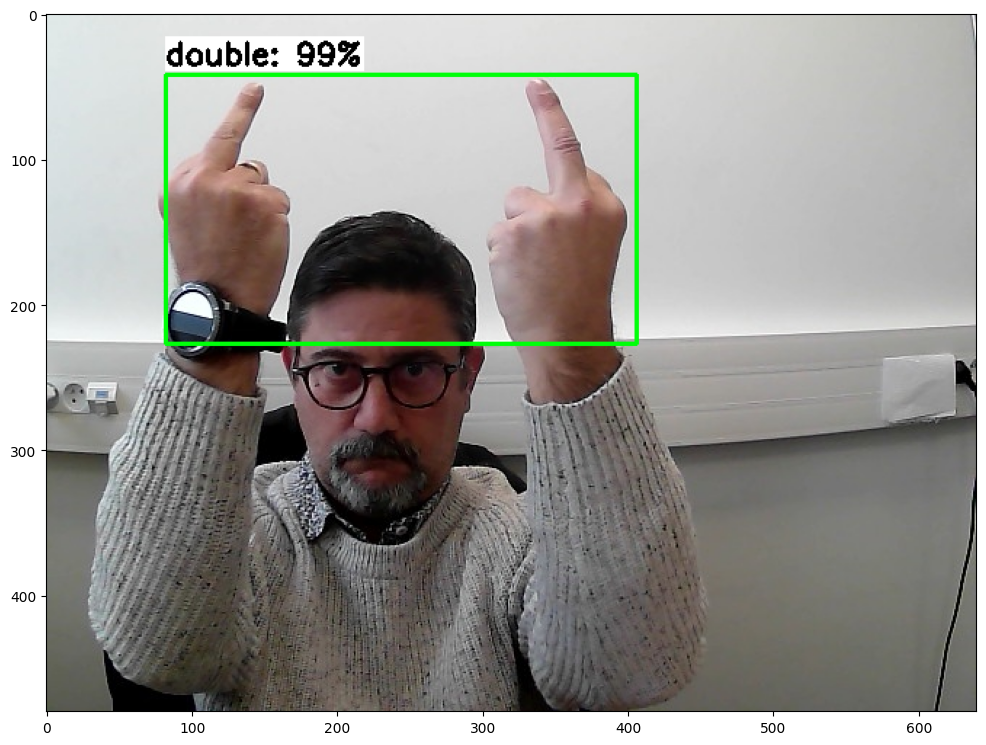

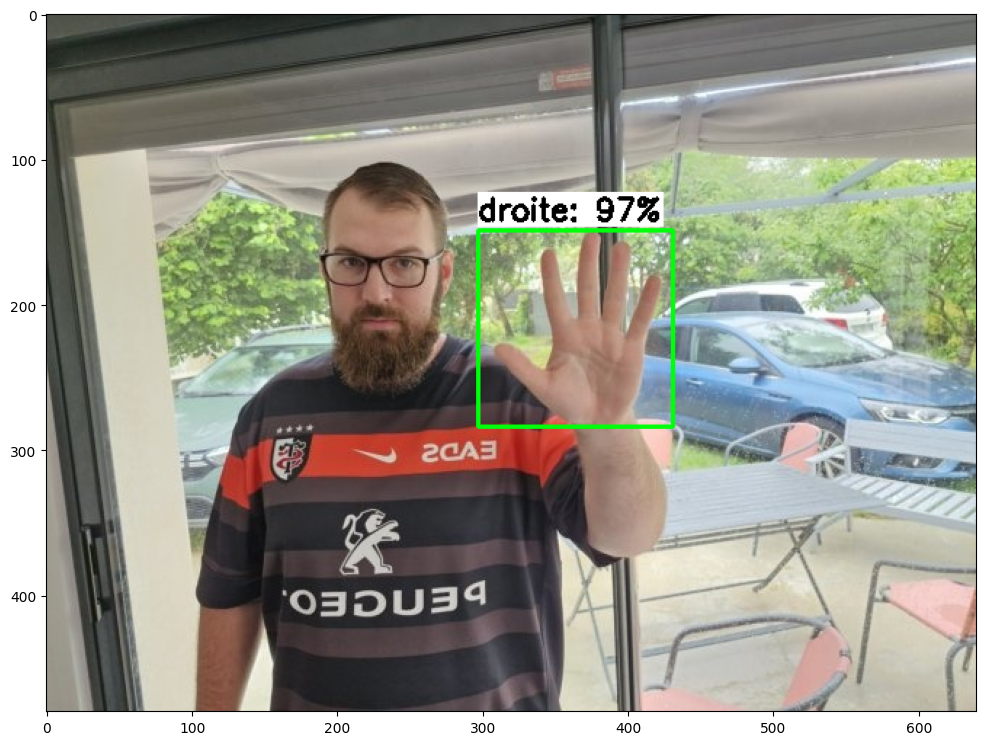

...

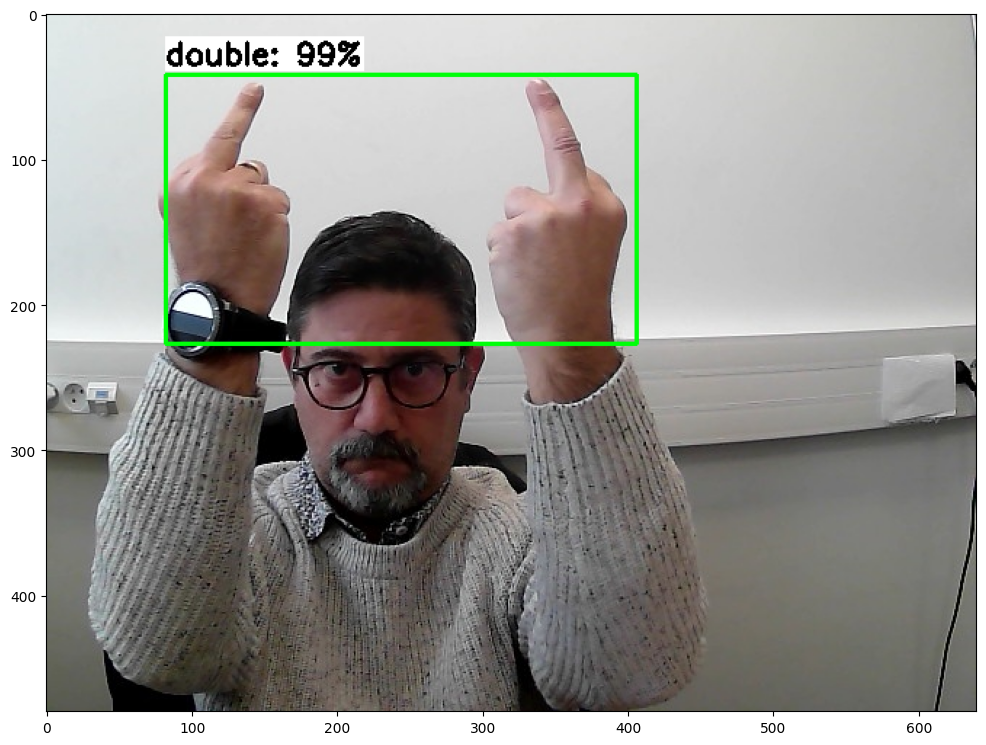

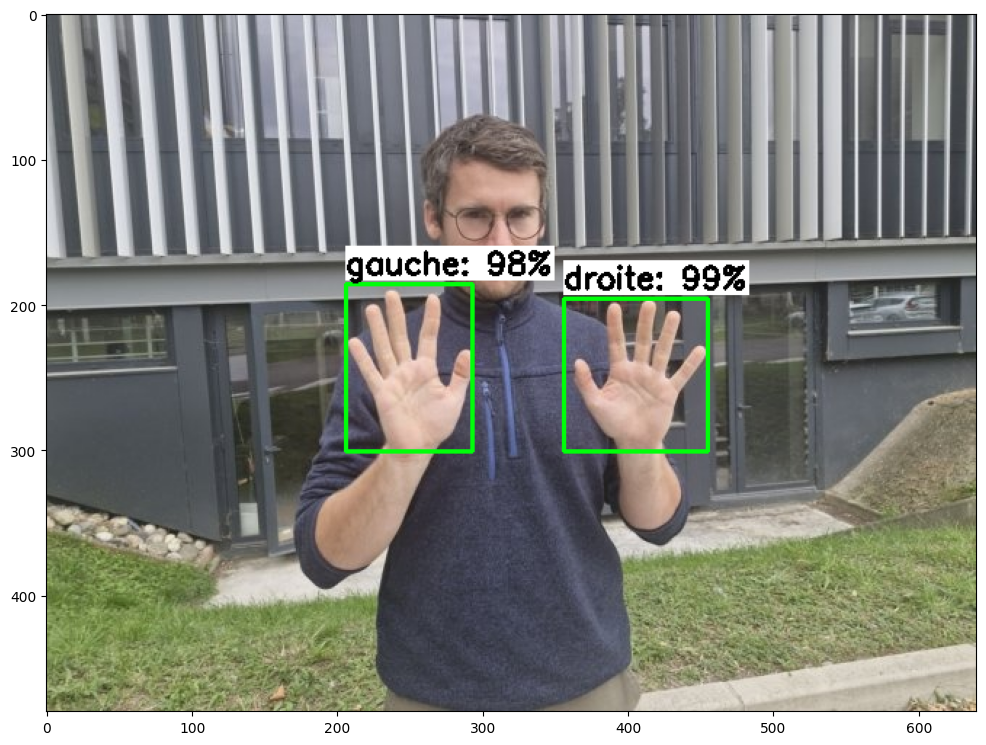

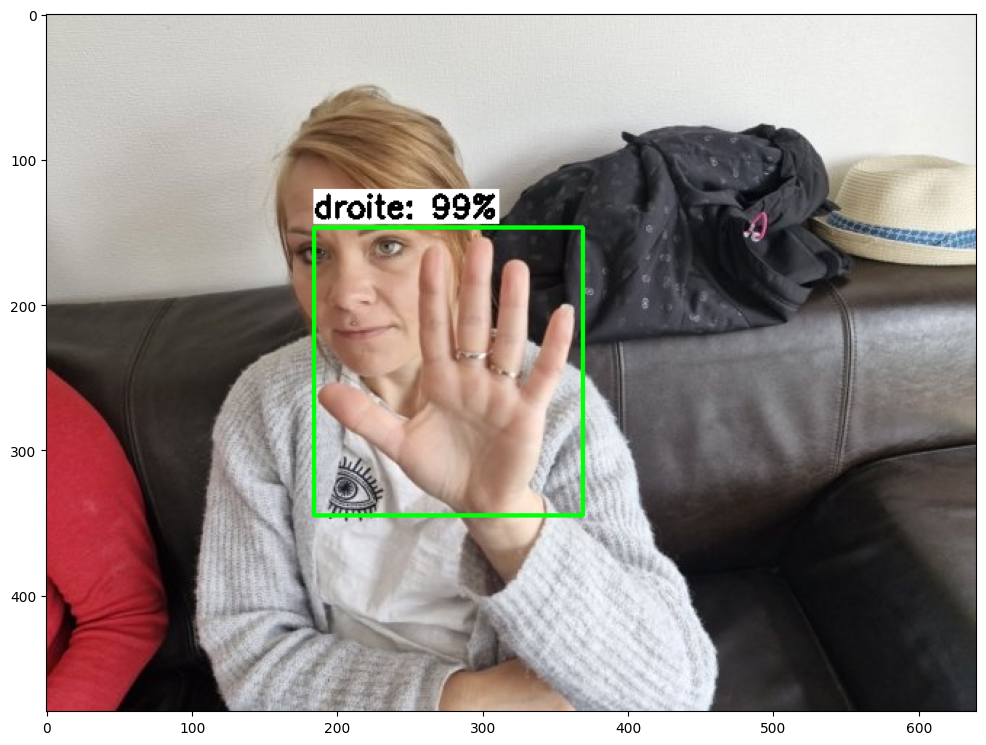

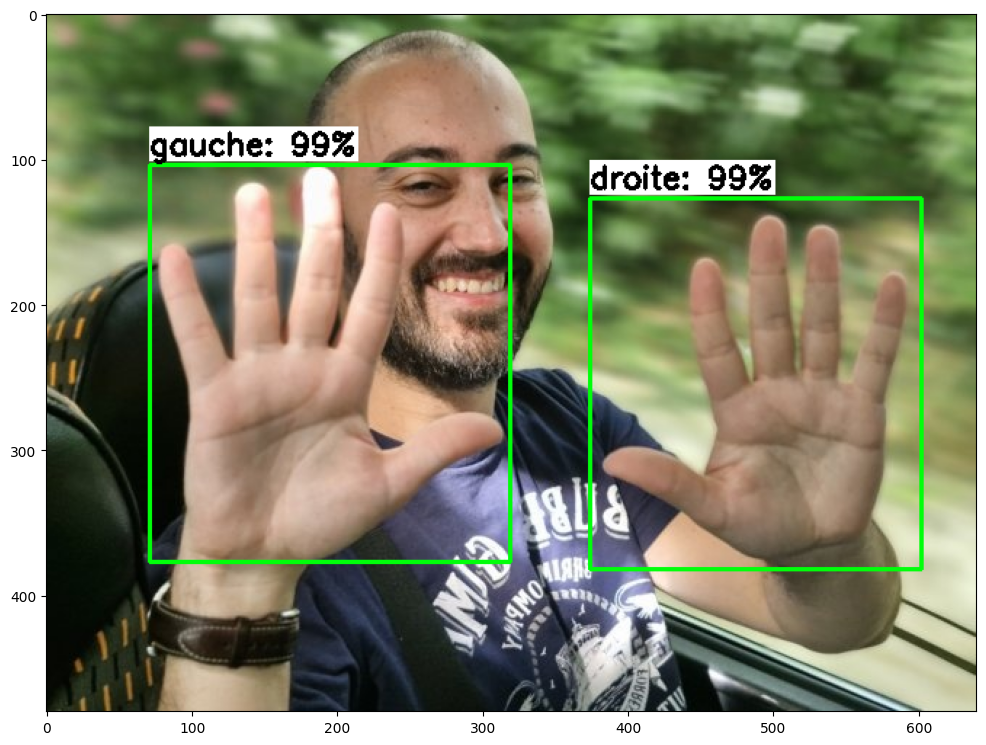

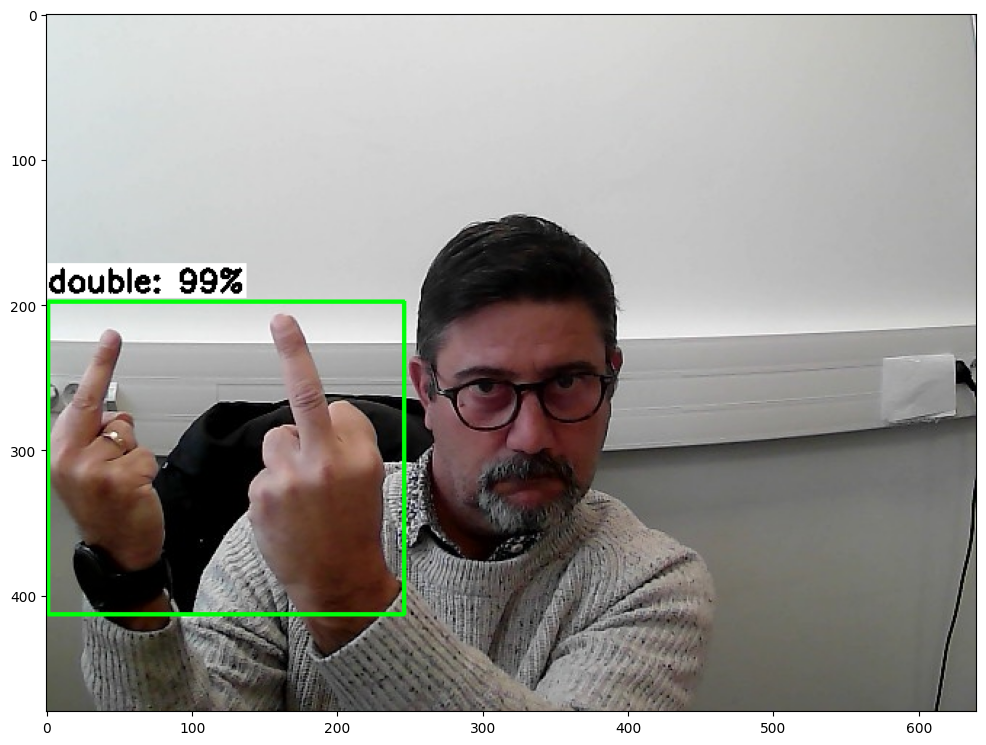

In [75]:
# Set up variables for running user's model
# Path to test images folder
PATH_TO_IMAGES=(os.path.join(WORK_PATH,"images","test").replace("\\","/"))
# Path to .tflite model file
PATH_TO_MODEL=(os.path.join(output_directory,"detect.tflite").replace("\\","/"))
# Path to labelmap.txt file
PATH_TO_LABELS=(os.path.join(WORK_PATH,'labelmap.txt').replace("\\","/"))
#Confidence threshold (try changing this to 0.01 if you don't see any detection results)
min_conf_threshold=0.7
# Number of images to run detection on
images_to_test = 24 

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

>### 5.2 Calcul du mAP (mean Average Precision)
>Nous visualisons désormais les performances de notre modèle sur les images de test, mais comment pouvons-nous mesurer quantitativement sa précision ?
>
>Une méthode courante pour mesurer la précision d'un modèle de détection d'objets est la « précision moyenne » (mAP). En gros, plus le score mAP est élevé, plus votre modèle est performant pour détecter des objets dans des images. Pour en savoir plus sur la mAP, consultez cet [article de Roboflow](https://blog.roboflow.com/mean-average-precision/).
>
>Nous utiliserons l'outil de calcul mAP disponible à l'adresse https://github.com/Cartucho/mAP pour déterminer le score mAP de notre modèle. Tout d'abord, nous devons cloner le GitHub et supprimer les exemples de données existants. Nous téléchargerons également un script permettant d'interagir avec le calculateur.

In [36]:
import glob
os.chdir(WORK_PATH)
!git clone https://github.com/Cartucho/mAP
os.chdir(WORK_PATH+'\mAP')
mAP=os.path.join(WORK_PATH,'mAP')
mAP=mAP.replace("\\","/")
files = glob.glob('input/detection-results/*') 
for f in files: 
    os.remove(f)
files = glob.glob('input/ground-truth/*') 
for f in files: 
    os.remove(f)
files = glob.glob('input/images-optional/*') 
for f in files: 
    os.remove(f)
!curl -O https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py


Cloning into 'mAP'...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  5397  100  5397    0     0  12836      0 --:--:-- --:--:-- --:--:-- 13036


>Dans la cellule suivante nous copierons les images et les données d'annotation du dossier **test** vers les dossiers appropriés pour le calcul de la mAP. Celles-ci seront utilisées comme « données de référence » en comparaison des résultats de notre modèle .

In [37]:
import shutil
src = os.path.join(WORK_PATH,'images','test').replace('\\','/')
dest=os.path.join(mAP,'input','images-optional').replace('\\','/')
dest2=os.path.join(mAP,'input','ground-truth').replace('\\','/')
for file in (glob.glob(src+"/*")):
    shutil.copy2(file, dest)

old_file=glob.glob(dest2+'/*')
for all_file in old_file:
    os.remove(all_file)

for file_xml in (glob.glob(dest+"/*.xml*")):
    file_xml=(file_xml).replace('\\','/')
    shutil.move(file_xml,dest2)
   
print ("all done")




all done


>L'outil de calcul attend des données d'annotation dans un format différent le format de fichier.xml que nous utilisons. Heureusement, il fournit un script simple, `convert_gt_xml.py`, pour la convertion au format .txt

In [38]:
!python {mAP}/scripts/extra/convert_gt_xml.py

Conversion completed!


>Nous avons configuré les données de référence, et nous avons maintenant besoin des résultats de détection réels de notre modèle. Les résultats de détection seront comparés aux données de référence afin de calculer la précision du modèle en mAP.
>
>La fonction d'inférence que nous avons définie à l'étape 5.1 est utilisée pour générer des données de détection pour toutes les images du dossier **test**. Nous l'utiliserons de la même manière que précédemment, sauf que cette fois-ci, nous lui demanderons d'enregistrer les résultats de détection dans le dossier `detection-results`.

In [40]:
# Set up variables for running user's model
# Path to test images folder
PATH_TO_IMAGES=(os.path.join(WORK_PATH,"images","test").replace("\\","/"))
# Path to .tflite model file
PATH_TO_MODEL=(os.path.join(output_directory,"detect.tflite").replace("\\","/"))
# Path to labelmap.txt file
PATH_TO_LABELS=(os.path.join(WORK_PATH,'labelmap.txt').replace("\\","/"))
#Confidence threshold (try changing this to 0.01 if you don't see any detection results)
min_conf_threshold=0.7
# Number of images to run detection on
images_to_test = 24 

In [41]:
# Set up variables for running inference, this time to get detection results saved as .txt files
# Path to test images folder
PATH_TO_IMAGES=(os.path.join(WORK_PATH,"images","test").replace("\\","/"))
# Path to .tflite model file
PATH_TO_MODEL=(os.path.join(output_directory,"detect.tflite").replace("\\","/"))
# Path to labelmap.txt file
PATH_TO_LABELS=(os.path.join(WORK_PATH,'labelmap.txt').replace("\\","/"))
# Folder to save detection results in
PATH_TO_RESULTS=(os.path.join(WORK_PATH,'mAP','input','detection-results').replace("\\","/"))
min_conf_threshold=0.7   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 48 images...
Finished inferencing!


>Calculons enfin le mAP ! Pour rapporter le mAP nous utiliserons la métrique COCO pour mAP @ 0,50:0,95. Concrètement, cela signifie que le mAP est calculé à plusieurs seuils IoU compris entre 0,50 et 0,95, puis que le résultat de chaque seuil est moyenné pour obtenir un score mAP final. Pour en savoir plus, [cliquez ici !](https://blog.roboflow.com/mean-average-precision/)
>
>Nous utiliserons un scipt déjà pret pour exécuter l'outil de calcul à chaque seuil IoU, faire la moyenne des résultats et communiquer le score de précision final. Il communique le mAP pour chaque classe et le mAP global.

In [42]:
os.chdir(mAP)
!python calculate_map_cartucho.py --labels={WORK_PATH}/labelmap.txt

71.43% = double AP 
43.94% = droite AP 
76.33% = gauche AP 
mAP = 63.90%
71.43% = double AP 
43.94% = droite AP 
76.33% = gauche AP 
mAP = 63.90%
71.43% = double AP 
43.94% = droite AP 
76.33% = gauche AP 
mAP = 63.90%
71.43% = double AP 
43.94% = droite AP 
76.33% = gauche AP 
mAP = 63.90%
71.43% = double AP 
43.94% = droite AP 
76.33% = gauche AP 
mAP = 63.90%
71.43% = double AP 
36.36% = droite AP 
76.33% = gauche AP 
mAP = 61.37%
71.43% = double AP 
36.36% = droite AP 
42.71% = gauche AP 
mAP = 50.17%
57.14% = double AP 
36.36% = droite AP 
36.46% = gauche AP 
mAP = 43.32%
14.29% = double AP 
36.36% = droite AP 
36.46% = gauche AP 
mAP = 29.04%
0.00% = double AP 
0.00% = droite AP 
0.00% = gauche AP 
mAP = 0.00%
Calculating mAP at 0.50 IoU threshold...
Calculating mAP at 0.55 IoU threshold...
Calculating mAP at 0.60 IoU threshold...
Calculating mAP at 0.65 IoU threshold...
Calculating mAP at 0.70 IoU threshold...
Calculating mAP at 0.75 IoU threshold...
Calculating mAP at 0.80 IoU 

>Le score indiqué à la fin correspond au score mAP global de votre modèle. Idéalement, il devrait être supérieur à 50 % (0,50). Si ce n'est pas le cas, vous pouvez améliorer la précision de votre modèle en ajoutant davantage d'images à votre ensemble de données. Vous pouvez si vous le souhaitez regarder la [vidéo de Edje Electronics](https://www.youtube.com/watch?v=v0ssiOY6cfg) pour capturer de bonnes images d'entraînement et améliorer la précision.

# 6.&nbsp;Déploiement du modèle TensorFlow Lite

>Maintenant que votre modèle personnalisé a été entraîné et converti au format TFLite, il est prêt à être téléchargé et déployé dans une application ! Cette section explique comment télécharger et le déployer sur le Raspberry Pi.

>## 6.1. Téléchargement du modèle TFLite 
>
>Exécutez les deux cellules suivantes pour copier les fichiers labelmap dans le dossier du modèle, les compresser dans un dossier zip, puis les télécharger. Le dossier zip contient le modèle `detect.tflite` et les fichiers labelmap `labelmap.txt` nécessaires pour exécuter le modèle sur votre raspberry PI.

In [44]:
import shutil
src1 = os.path.join(WORK_PATH,'labelmap.txt').replace('\\','/')
src2= os.path.join(WORK_PATH,'labelmap.pbtxt').replace('\\','/')
src3= os.path.join(WORK_PATH,'models','mymodel','pipeline_file.config').replace('\\','/')


dest_final=output_directory.replace('\\','/')

shutil.copy2(src1, dest_final)
shutil.copy2(src2, dest_final)
shutil.copy2(src3, dest_final)

#on se positionne dans le dossier de travail avant de sauvegarder en .zip notre modèle pour raspberry PI
os.chdir(WORK_PATH)

print(dest_final)


D:/bibi/test_atelier/mifobio_discoscope/mon_model


In [45]:
archive=shutil.make_archive('mon_model','zip',output_directory)

>Le fichier `mon_model.zip` contenant le modèle sera copier dans le dossier de travail. Il est prêt à être déployé sur votre appareil !

## 6.2. Déploiement du modèle
Les modèles TensorFlow Lite peuvent fonctionner sur une grande variété de matériels, notamment les PC, les systèmes embarqués et les téléphones. Cette section fournit des instructions indiquant comment déployer votre modèle.

### 6.2.1. Deploy on Raspberry Pi
Les modèles TFLite sont parfaits pour fonctionner sur le Raspberry Pi, car ils nécessitent moins de puissance de traitement que les modèles de vision TensorFlow classiques. La raspberry PI peut exécuter les modèles TFLite en temps quasi réel.

Pour exécuter votre modèle sur le Raspberry Pi, vous devrez installer TensorFlow Lite et préparer un environnement Python pour votre application. Je fournis des instructions étape par étape sur la façon de configurer TFLite sur le Pi dans ma vidéo intitulée « Comment exécuter TensorFlow Lite sur Raspberry Pi pour la détection d'objets ».

To run your new model on the Raspberry Pi, you'll have to install TensorFlow Lite and prepare a Python environment for your application. I provide step-by-step instructions on how to set up TFLite on the Pi in my video, [How To Run TensorFlow Lite on Raspberry Pi for Object Detection](https://youtu.be/aimSGOAUI8Y).

[![Link to my YouTube video!](https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/doc/YouTube_video1.JPG)](https://www.youtube.com/watch?v=aimSGOAUI8Y)

Once you've completed all the steps in the video, move the `custom_model_lite.zip` file downloaded from this Colab session over to your Raspberry Pi into the `~/tflite1` folder. Move into the folder and unzip it by issuing:

```
cd ~/tflite1
unzip mon_model.zip
```

Then, run the image, video, or webcam TFLite detection program with the `--modeldir=fine_tuned_model_lite` argument. For example, to run the webcam detection program, issue:

```
python TFLite_detection_webcam.py --modeldir=custom_model_lite
```

A window will appear showing a live feed from your webcam with boxes drawn around detected objects in each frame.

### 6.2.2. Deploy on Windows, Linux, or macOS
Follow the instructions linked below to quickly set up your Windows, Linux, or macOS computer to run TFLite models. It only takes a few minutes! Running a model on your PC is good for quickly testing your model with a webcam. However, keep in mind that the TFLite Runtime is optimized for lower-power processors, and it won't utilize the full capability of your PC's processor.

Here are links to the deployment guides for Windows, Linux, and macOS:
* [How to Run TensorFlow Lite Models on Windows](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/deploy_guides/Windows_TFLite_Guide.md)
* *link to Linux guide to be added (but really it's the same as Raspberry Pi)*
* [How to Run TensorFlow Lite Models on macOS](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/deploy_guides/MacOS_TFLite_Guide.md)







## 9.1. Quantize model
We'll use the "TFLiteConverter" module to perform [post-training quantization](https://www.tensorflow.org/lite/performance/post_training_quantization) on the model. To quantize the model, we need to provide a representative dataset, which is a set of images that represent what the model will see when deployed in the field. First, we'll create a list of images to include in the representative dataset (we'll just use the images in the `train` folder).


In [ ]:
# Get list of all images in train directory
image_path = image_path = (os.path.join(WORK_PATH,'images','test').replace("\\","/"))

jpg_file_list = glob.glob(image_path + '/*.jpg')
#JPG_file_list = glob.glob(image_path + '/*.JPG')
#png_file_list = glob.glob(image_path + '/*.png')
#bmp_file_list = glob.glob(image_path + '/*.bmp')
#quant_image_list = jpg_file_list + JPG_file_list + png_file_list + bmp_file_list
quant_image_list = jpg_file_list

Next, we'll define a function to yield images from our representative dataset. Refer to [TensorFlow's sample quantization code](https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb#scrollTo=kRDabW_u1wnv) to get a better understanding of what this is doing!

In [ ]:
# A generator that provides a representative dataset
# Code modified from https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb

# First, get input details for model so we know how to preprocess images
interpreter = Interpreter(model_path=PATH_TO_MODEL) # PATH_TO_MODEL is defined in Step 7 above
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
height = input_details[0]['shape'][1]
width = input_details[0]['shape'][2]

import random

def representative_data_gen():
  dataset_list = quant_image_list
  quant_num = 300
  for i in range(quant_num):
    pick_me = random.choice(dataset_list)
    image = tf.io.read_file(pick_me)

    if pick_me.endswith('.jpg') or pick_me.endswith('.JPG'):
      image = tf.io.decode_jpeg(image, channels=3)
    elif pick_me.endswith('.png'):
      image = tf.io.decode_png(image, channels=3)
    elif pick_me.endswith('.bmp'):
      image = tf.io.decode_bmp(image, channels=3)

    image = tf.image.resize(image, [width, height])  # TO DO: Replace 300s with an automatic way of reading network input size
    image = tf.cast(image / 255., tf.float32)
    image = tf.expand_dims(image, 0)
    yield [image]

Finally, we'll initialize the TFLiteConverter module, point it at the TFLite graph we generated in Step 6, and provide it with the representative dataset generator function we created in the previous code block. We'll configure the converter to quantize the model's weight values to INT8 format.

In [ ]:
# Initialize converter module
converter = tf.lite.TFLiteConverter.from_saved_model(output_directory+'/saved_model')

# This enables quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
# This sets the representative dataset for quantization
converter.representative_dataset = representative_data_gen
# This ensures that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# For full integer quantization, though supported types defaults to int8 only, we explicitly declare it for clarity.
converter.target_spec.supported_types = [tf.int8]
# These set the input tensors to uint8 and output tensors to float32
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.float32
tflite_model = converter.convert()

with open(output_directory+'/detect_quant.tflite', 'wb') as f:
  f.write(tflite_model)

## 9.2. Test quantized model
The model has been quantized and exported as `detect_quant.tflite`. Let's test it out! We'll re-use the function from Section 7 for running the model on test images and display the results, except this time we'll point it at the quantized model.

Click Play on the code block below to test the `detect_quant.tflite` model.

In [ ]:
# Set up parameters for inferencing function (using detect_quant.tflite instead of detect.tflite)

PATH_TO_MODEL=output_directory+'/detect_quant.tflite'   #Path to .tflite model file

min_conf_threshold=0.7   #Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   #Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

If your quantized model isn't performing very well, try using my TensorFlow Lite 1 notebook *(link to be added)* to train a SSD-MobileNet model with your dataset. In my experience, the `ssd-mobilenet-v2-quantized` model from the [TF1 Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md) has the best quantized performance out of any other TensorFlow Lite model.

TFLite models created with TensorFlow 1 are still compatible with the TensorFlow Lite 2 runtime, so your TFLite 1 model will still work with my [TensorFlow setup guide for the Raspberry Pi](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Raspberry_Pi_Guide.md).

## 9.3 Calculate quantized model mAP

Let's calculate the quantize model's mAP using the calculator tool we set up in Step 7.2. We just need to perform inference with our quantized model (`detect_quant.tflite`) to get a new set of detection results.

Run the following block to run inference on the test images and save the detection results.

In [ ]:
# Need to remove existing detection results first
!rm /content/mAP/input/detection-results/*

# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect_quant.tflite'   # Path to quantized .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Now we can run the mAP calculation script to determine our quantized model's mAP.

In [ ]:
cd /content/mAP

In [ ]:
!python calculate_map_cartucho.py --labels=/content/labelmap.txt